# Mass Action Kinetics & signal processing by small circuits

This worksheet guides you through modeling increasingly complex small regulatory circuits, from simple transcriptional activators and repressors (with inducers) to combinatorial regulation, FFLs and multistable switches. 

# 1. Simple transcriptional activation

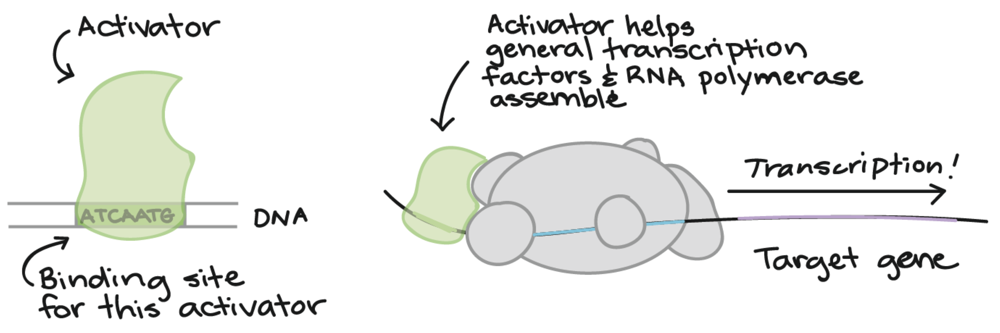

**Reaction schemas:**
    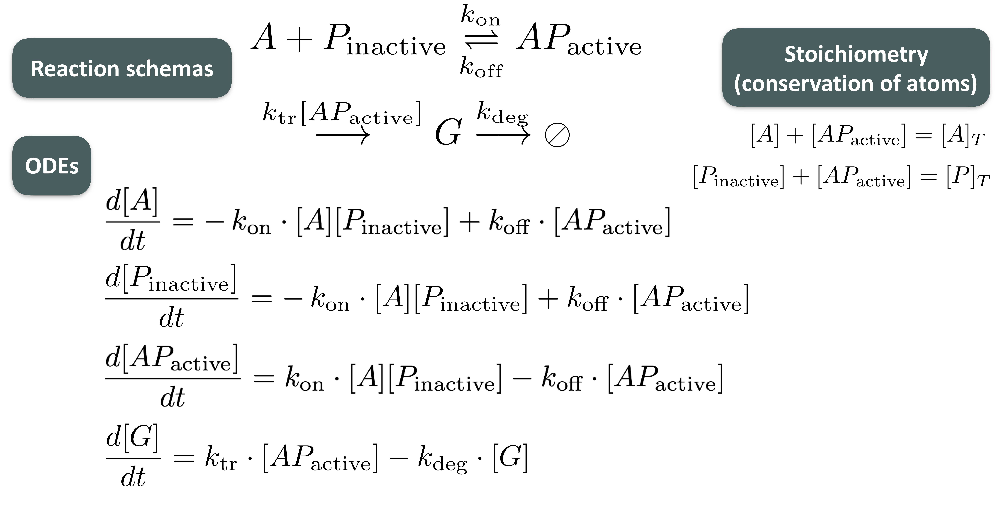

Adapt the following code modeling the Michaelis-Menten equation to run the system of ODEs above, represeting simple transcriptional activation of gene G by transcription factor A. When you are done, the graph generated below should show the levels of free A, Active (A-bound) promoter and Gene as a funciton of time, assuming that the transcription factor A gains access to the nucleus at time 0 (and thus \[G\] (0) = 0, and so is the fraction of active promoters).

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

# definition of system of ODEs

def reaction_system(state,t):
    [E,S,ES,P] = state
    d_E = -k_on*E*S + k_off*ES + kcat*ES
    d_S = -k_on*E*S + k_off*ES
    d_ES = k_on*E*S - k_off*ES - kcat*ES
    d_P = kcat*ES
    return [d_E,d_S,d_ES,d_P]

# definition of reaction rates:

k_on = 0.4
k_off = 0.5
kcat = 3

# total levels of conserved quantities (e.g., total enzyme), and initial concetrations

E0 = 1
S0 = 2
init_state = [E0, S0, 0, 0]

# time range and size of steps covered by simulation -- adjust this as needed once you start generating graphs

t = np.arange(0, 20, 0.1)

# command that integrates the ODEs; this calculates the state of the system at every timestep along the above range
# and stores it in a 2D list of states where each row is a time-point and each column corresponds to the 
# concetration of one of the system's variables, in the order listed in the reaction_system function 

state = odeint(reaction_system, init_state, t)

#this plots the time-dependent concentrations; note the reference to individual columns of the state matrix:
fig = plt.figure()
plt.xlim(0,t[-1]) # this sets the x axis to covet the time range integrated above
plt.plot(t,state[:, 0],'k-',label = 'E')
plt.plot(t,state[:, 1],'b-',label = 'S')
plt.plot(t,state[:, 2],'r-',label = 'ES')
plt.plot(t,state[:, 3],'g-',label = 'P')

plt.ylabel('concentrations')
plt.xlabel('time')
plt.legend()
plt.show()

<Figure size 640x480 with 1 Axes>

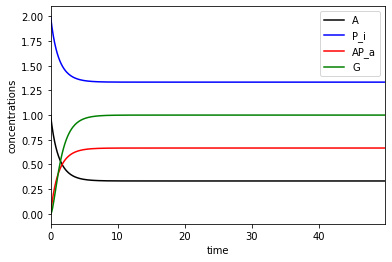

In [25]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

# definition of system of ODEs

def reaction_system(state,t):
    [A,P_i,AP_a,G] = state
    d_A = -k_on*A*P_i + k_off*AP_a
    d_P_i = -k_on*A*P_i + k_off*AP_a
    d_AP_a = k_on*A*P_i - k_off*AP_a
    d_G = k_tr*AP_a - k_deg*G
    return [d_A,d_P_i,d_AP_a,d_G]

# definition of reaction rates:

k_on = 0.3
k_off = 0.2
k_tr = 3
k_deg = 2


# total levels of conserved quantities (e.g., total activator), and initial concetrations

A0 = 1
P_i0 = 2
init_state = [A0, P_i0, 0, 0]

# time range and size of steps covered by simulation -- adjust this as needed once you start generating graphs

t = np.arange(0, 50, 0.1)

# command that integrates the ODEs; this calculates the state of the system at every timestep along the above range
# and stores it in a 2D list of states where each row is a time-point and each column corresponds to the 
# concetration of one of the system's variables, in the order listed in the reaction_system function 

state = odeint(reaction_system, init_state, t)

#this plots the time-dependent concentrations; note the reference to individual columns of the state matrix:
fig = plt.figure()
plt.xlim(0,t[-1]) # this sets the x axis to covet the time range integrated above
plt.plot(t,state[:, 0],'k-',label = 'A')
plt.plot(t,state[:, 1],'b-',label = 'P_i')
plt.plot(t,state[:, 2],'r-',label = 'AP_a')
plt.plot(t,state[:, 3],'g-',label = 'G')

plt.ylabel('concentrations')
plt.xlabel('time')
plt.legend()
plt.show()

Now, adapt the following code to test the the behavior of your system as you change the rate of transcription, *k_tr*. To do this, set up a range of *k_tr* values to explore, then set up a for loop to run the system of ODE's multiple times with different *k_tr* values, and finally plot a series of \[G\] (t) graphs at different *k_tr* rates. Use these to answer the quesiton: **How does the gene's response time change as a function of *k_tr*?**

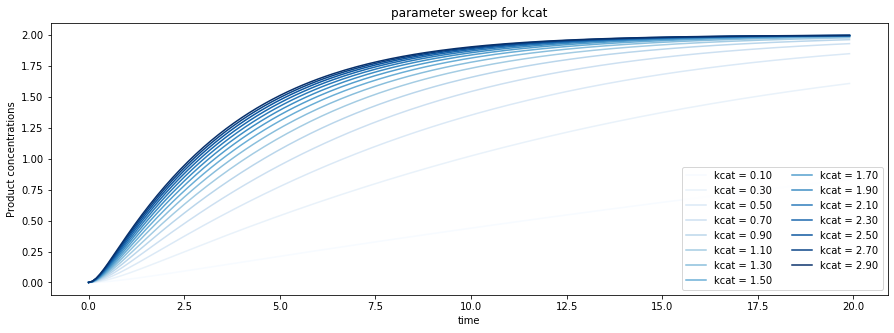

In [3]:
from ipywidgets import interactive
import matplotlib.animation as animation
from IPython.display import HTML


# range of k_cat values to investigate -- alter this to your system 
kcat_sweep = np.arange(0.1, 3, 0.2)

# tunning a series of ODEs and adding the results to an empty list of states 
# (note that the result will be a list of 2D arrays!)

states_all = [] 
init_state = [E0, S0, 0, 0]

for kcat in kcat_sweep:  # note that this resets the value of kcat in each step to a member of the range
    state = odeint(reaction_system, init_state, t)
    states_all.append(state) #this adds the result of each run to the list


# this fuction normalizes the value of a variable to fall between 0 to 1 given its minimum and maximum range 
def norm_col(p,pmin,pmax):
    return (p - pmin) / float(pmax - pmin)

# plotting the resulting \[P\] (t) graphs for each run:


plt.figure(figsize = (15,5))

i=0
for kcat in kcat_sweep: 
    color = plt.cm.Blues(norm_col(kcat,min(kcat_sweep),max(kcat_sweep)))
    # this changes the color along a blue spectrum
    plt.plot(t,states_all[i][:, 3],c=color,label = 'P') 
    #note that we plot column 3 (the product) of the i-th element of the list
    i+=1
    #finally, we increase i after every plot

leg = plt.legend(['kcat = %0.2f' % v for v in kcat_sweep], ncol=2)

plt.ylabel('Product concentrations')
plt.xlabel('time')
plt.title('parameter sweep for kcat')
plt.show()


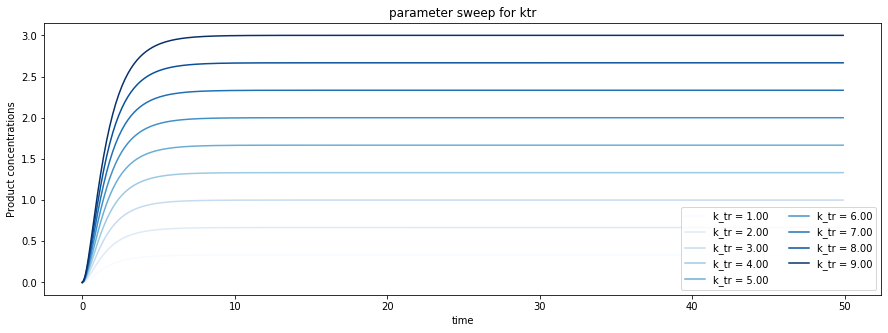

In [27]:
from ipywidgets import interactive
import matplotlib.animation as animation
from IPython.display import HTML


# range of k_tr_sweep values to investigate -- alter this to your system 
k_tr_sweep = np.arange(1, 10, 1)

# tunning a series of ODEs and adding the results to an empty list of states 
# (note that the result will be a list of 2D arrays!)

states_all = [] 
init_state = [A0, P_i0, 0, 0]

for k_tr in k_tr_sweep:  # note that this resets the value of kcat in each step to a member of the range
    state = odeint(reaction_system, init_state, t)
    states_all.append(state) #this adds the result of each run to the list


# this fuction normalizes the value of a variable to fall between 0 to 1 given its minimum and maximum range 
def norm_col(p,pmin,pmax):
    return (p - pmin) / float(pmax - pmin)

# plotting the resulting \[P\] (t) graphs for each run:


plt.figure(figsize = (15,5))

i=0
for k_tr in k_tr_sweep: 
    color = plt.cm.Blues(norm_col(k_tr,min(k_tr_sweep),max(k_tr_sweep)))
    # this changes the color along a blue spectrum
    plt.plot(t,states_all[i][:, 3],c=color,label = 'P') 
    #note that we plot column 3 (the product) of the i-th element of the list
    i+=1
    #finally, we increase i after every plot

leg = plt.legend(['k_tr = %0.2f' % v for v in k_tr_sweep], ncol=2)

plt.ylabel('Product concentrations')
plt.xlabel('time')
plt.title('parameter sweep for ktr')
plt.show()


# 2. Transcriptional activation with an inducible TF

Repeat the above coding tasks for an inducible TF with a Hill coefficient h describing the number of inducer molecules required to activate the TF. When you are done, you should have:

  -- a block of code where you run and plot the state of all system variables as a function of time for a given set of parameters, starting with the moment the inducer becomes available and starts binding the TF
  
  -- a block of code where you plot the increase and saturation of G for a series of Hill coefficients characterizing the cooperative binding of the inducer to the TF 

<div>
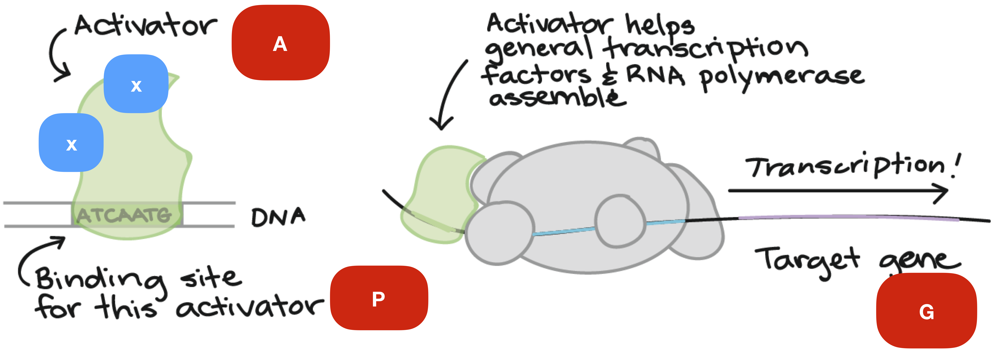 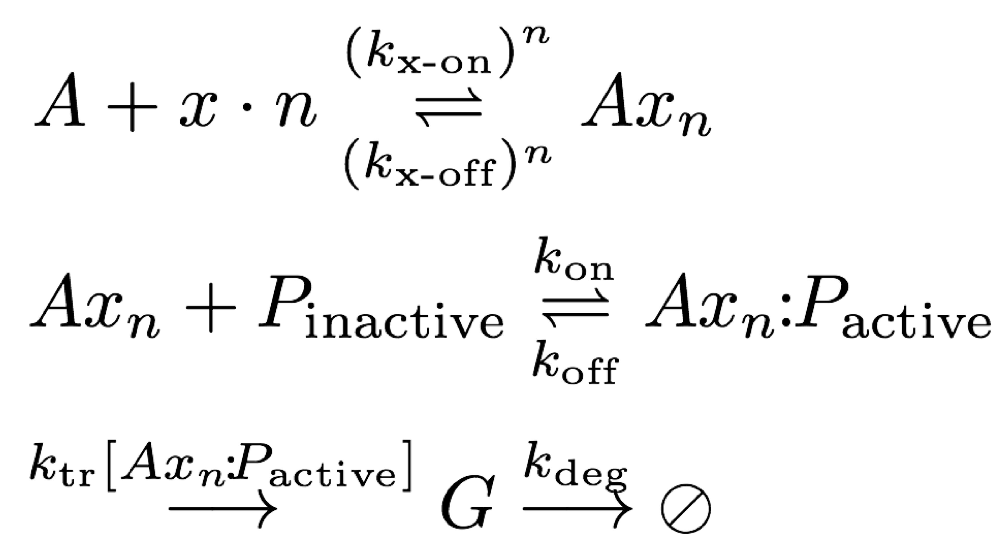
</div>


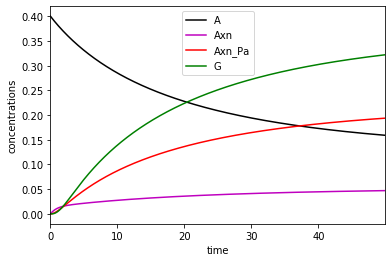

In [9]:
# code to plot state of system as a funciton of time goes here
def inducer_trs(state,t):
    [A,x,Axn,P_i,Axn_Pa,G] = state
    d_A = -A*(x**n)*(kx_on**n) + (kx_off**n)*Axn
    d_x = -A*(x**n)*(kx_on**n) + (kx_off**n)*Axn
    d_Axn = (kx_on**n)*A*(x**n) + k_off*Axn_Pa - k_on*Axn*P_i - (kx_off**n)*Axn
    d_P_i = k_off*Axn_Pa - k_on*Axn*P_i
    d_Axn_Pa = k_on*Axn*P_i - k_off*Axn_Pa
    d_G = k_tr*Axn_Pa - k_deg*G
    return [d_A,d_x,d_Axn,d_P_i,d_Axn_Pa,d_G]

# definition of reaction rates:

kx_on = 0.3
kx_off = 0.2
k_on = 0.3
k_off = 0.2
k_tr = 3
k_deg = 1.8

# Hill coeffecient 
n = 2


# total levels of conserved quantities (e.g., total activator), and initial concetrations

A0 = 0.4
x = 0.7
P_i0 = 3
init_state =  [A0,x,0,P_i0,0,0]

# time range and size of steps covered by simulation -- adjust this as needed once you start generating graphs

t = np.arange(0, 50, 0.01)

# command that integrates the ODEs; this calculates the state of the system at every timestep along the above range
# and stores it in a 2D list of states where each row is a time-point and each column corresponds to the 
# concetration of one of the system's variables, in the order listed in the reaction_system function 

state = odeint(inducer_trs, init_state, t)

#this plots the time-dependent concentrations; note the reference to individual columns of the state matrix:
fig = plt.figure()
plt.xlim(0,t[-1]) # this sets the x axis to covet the time range integrated above
plt.plot(t,state[:, 0],'k-',label = 'A')
#plt.plot(t,state[:, 1],'y-',label = 'x')
plt.plot(t,state[:, 2],'m-',label = 'Axn')
#plt.plot(t,state[:, 3],'b-',label = 'P_i')
plt.plot(t,state[:, 4],'r-',label = 'Axn_Pa')
plt.plot(t,state[:, 5],'g-',label = 'G')

plt.ylabel('concentrations')
plt.xlabel('time')
plt.legend()
plt.show()

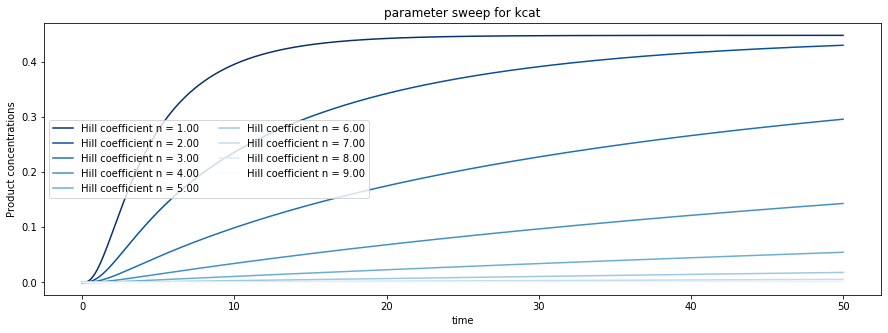

In [9]:
# code to test the time-dependent accumulation of G at different Hill coefficient values goes here.
from ipywidgets import interactive
import matplotlib.animation as animation
from IPython.display import HTML


# range of k_tr_sweep values to investigate -- alter this to your system 
n_sweep = np.arange(1, 10, 1)

# tunning a series of ODEs and adding the results to an empty list of states 
# (note that the result will be a list of 2D arrays!)

states_all = [] 
init_state = [A0,x,0,P_i0,0,0]

for n in n_sweep:  # note that this resets the value of kcat in each step to a member of the range
    state = odeint(inducer_trs, init_state, t)
    states_all.append(state) #this adds the result of each run to the list


# this fuction normalizes the value of a variable to fall between 0 to 1 given its minimum and maximum range 
def norm_col(p,pmin,pmax):
    return (p - pmin) / float(pmax - pmin)

# plotting the resulting \[G\] (t) graphs for each run:


plt.figure(figsize = (15,5))

i=0
for n in n_sweep: 
    color = plt.cm.Blues(norm_col(n,max(n_sweep),min(n_sweep)))
    # this changes the color along a blue spectrum
    plt.plot(t,states_all[i][:, 5],c=color,label = 'P') 
    #note that we plot column 3 (the product) of the i-th element of the list
    i+=1
    #finally, we increase i after every plot

leg = plt.legend(['Hill coefficient n = %0.2f' % v for v in n_sweep], ncol=2)

plt.ylabel('Product concentrations')
plt.xlabel('time')
plt.title('parameter sweep for kcat')
plt.show()


Now, use the following code to alter the availability of your inducer as a function of time, and monitor the system's response

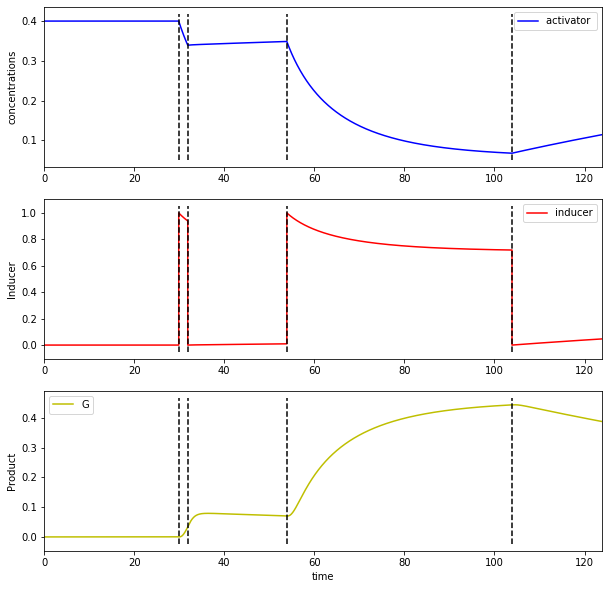

In [12]:
# the data structure below specifies a series of intervals where the first number represents the level of the inducer,
# the second represents the end of the time window for this value. 
# E.g., below the inducer is absent until time 30, present until time 32, absent again until 54, ect.

inducer_signal = [(0,30),(1,32),(0,54),(1,104),(0,124)]

# this sets the initial state; we use these to add each interval's results to it
state = [[A0,0,0,P_i0,0,0]] 
# I start the system with no enzyme and S0 amount of free substrate

process = state
# process will accumulate the results from chunks of run

time = [0]

# this for loop runs each unique interval separately, and accumulates the results

for (inducer,time_int) in inducer_signal:
    t = np.arange(0, time_int-time[-1], 0.1) 
    # this sets the next time-interval from the end of the previous one to the next end-point
    init_state = state[-1]
    # this sets the initial state for this interval to the last state of the previous one
    # that said, we are changing the level of inducer for each interval, so we will override its value. 
    # since the code above works with the MM equation, here I will modulate the enzyme level as if it were equal to the inducer value we are changing in each steps
    init_state[1] = inducer
    state = odeint(inducer_trs, init_state, t)
    process = np.concatenate((process,state),axis=0)
    time = np.concatenate((time,time[-1]+t),axis=0)


#[A,x,Axn,P_i,Axn_Pa,G] = state
    
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(311)
plt.xlim(0,time[-1])
plt.plot(time,process[:, 0],'b-',label = 'activator ')
(ymin, ymax) = ax.get_ylim()

for (inducer,time_int) in inducer_signal:
    plt.plot([time_int,time_int],[ymin,ymax],'k--')

plt.ylabel('concentrations')
plt.legend()

ax = fig.add_subplot(312)
plt.xlim(0,time[-1])
plt.plot(time,process[:, 1],'r-',label = 'inducer')
(ymin, ymax) = ax.get_ylim()
for (inducer,time_int) in inducer_signal:
    plt.plot([time_int,time_int],[ymin,ymax],'k--')
#plt.plot([time[0],time[-1]],[Tr_Y,Tr_Y],'k--',label = 'threshold')
  # this can add a threshold
plt.ylabel('Inducer')
plt.legend()
ax = fig.add_subplot(313)
plt.xlim(0,time[-1])
plt.plot(time,process[:, 5],'y-',label = 'G')
(ymin, ymax) = ax.get_ylim()

for (inducer,time_int) in inducer_signal:
    plt.plot([time_int,time_int],[ymin,ymax],'k--')
plt.ylabel('Product')
plt.legend()
plt.xlabel('time')
plt.show()


# 3. Transcriptional repression with an inducible TF

Now, repeat everything you have done with the inducible activator, but this time make your TF a repressor.

-- run and plot the state of all system variables as a function of time for a given set of parameters, starting with the moment the inducer becomes available and starts binding the TF

-- plot the change in G for a series of Hill coefficients characterizing the cooperative binding of the inducer to the TF

-- plot G as a funciton of inducer levels that vary at different intervals, as above

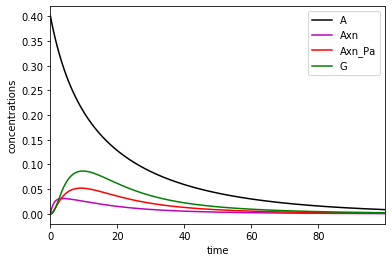

In [6]:
# code goes here
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import odeint

def repressor_trs(state,t):
    [A,x,Axn,P_i,Axn_Pa,G] = state
    d_A = -A*(x**n)*(kx_on**n) + (kx_off**n)*Axn
    d_x = -A*(x**n)*(kx_on**n) + (kx_off**n)*Axn
    d_Axn = (kx_on**n)*A*(x**n) + k_off*Axn_Pa - k_on*Axn*P_i - (kx_off**n)*Axn
    d_P_i = k_on*Axn_Pa - k_off*Axn*P_i
    d_Axn_Pa = k_off*Axn*P_i - k_on*Axn_Pa
    d_G = k_tr*Axn_Pa - k_deg*G
    return [d_A,d_x,d_Axn,d_P_i,d_Axn_Pa,d_G]

# definition of reaction rates:

kx_on = 0.3
kx_off = 0.2
k_on = 0.3
k_off = 0.2
k_tr = 3
k_deg = 1.8

# Hill coeffecient 
n = 2


# total levels of conserved quantities (e.g., total activator), and initial concetrations

A0 = 0.4
x = 1
P_i0 = 3
init_state =  [A0,x,0,P_i0,0,0]

# time range and size of steps covered by simulation -- adjust this as needed once you start generating graphs

t = np.arange(0, 100, 0.01)

# command that integrates the ODEs; this calculates the state of the system at every timestep along the above range
# and stores it in a 2D list of states where each row is a time-point and each column corresponds to the 
# concetration of one of the system's variables, in the order listed in the reaction_system function 

state = odeint(repressor_trs, init_state, t)

#this plots the time-dependent concentrations; note the reference to individual columns of the state matrix:
fig = plt.figure()
plt.xlim(0,t[-1]) # this sets the x axis to covet the time range integrated above
plt.plot(t,state[:, 0],'k-',label = 'A')
#plt.plot(t,state[:, 1],'y-',label = 'x')
plt.plot(t,state[:, 2],'m-',label = 'Axn')
#plt.plot(t,state[:, 3],'b-',label = 'P_i')
plt.plot(t,state[:, 4],'r-',label = 'Axn_Pa')
plt.plot(t,state[:, 5],'g-',label = 'G')

plt.ylabel('concentrations')
plt.xlabel('time')
plt.legend()
plt.show()

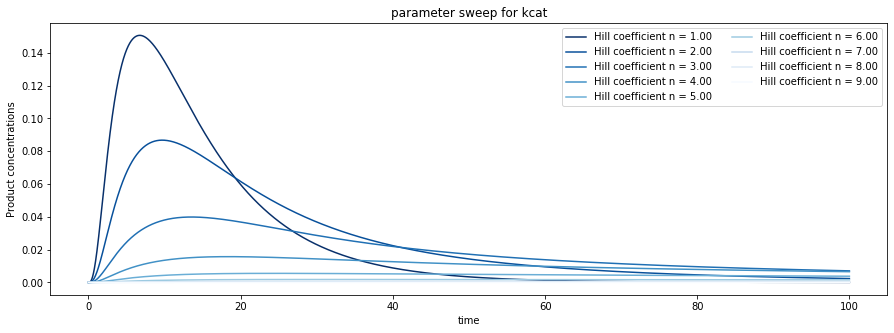

In [5]:
# code to test the time-dependent accumulation of G at different Hill coefficient values goes here.
from ipywidgets import interactive
import matplotlib.animation as animation
from IPython.display import HTML


# range of k_tr_sweep values to investigate -- alter this to your system 
n_sweep = np.arange(1, 10, 1)

# tunning a series of ODEs and adding the results to an empty list of states 
# (note that the result will be a list of 2D arrays!)

states_all = [] 
init_state = [A0,x,0,P_i0,0,0]

for n in n_sweep:  # note that this resets the value of kcat in each step to a member of the range
    state = odeint(repressor_trs, init_state, t)
    states_all.append(state) #this adds the result of each run to the list


# this fuction normalizes the value of a variable to fall between 0 to 1 given its minimum and maximum range 
def norm_col(p,pmin,pmax):
    return (p - pmin) / float(pmax - pmin)

# plotting the resulting \[G\] (t) graphs for each run:


plt.figure(figsize = (15,5))

i=0
for n in n_sweep: 
    color = plt.cm.Blues(norm_col(n,max(n_sweep),min(n_sweep)))
    # this changes the color along a blue spectrum
    plt.plot(t,states_all[i][:, 5],c=color,label = 'P') 
    #note that we plot column 3 (the product) of the i-th element of the list
    i+=1
    #finally, we increase i after every plot

leg = plt.legend(['Hill coefficient n = %0.2f' % v for v in n_sweep], ncol=2)

plt.ylabel('Product concentrations')
plt.xlabel('time')
plt.title('parameter sweep for kcat')
plt.show()


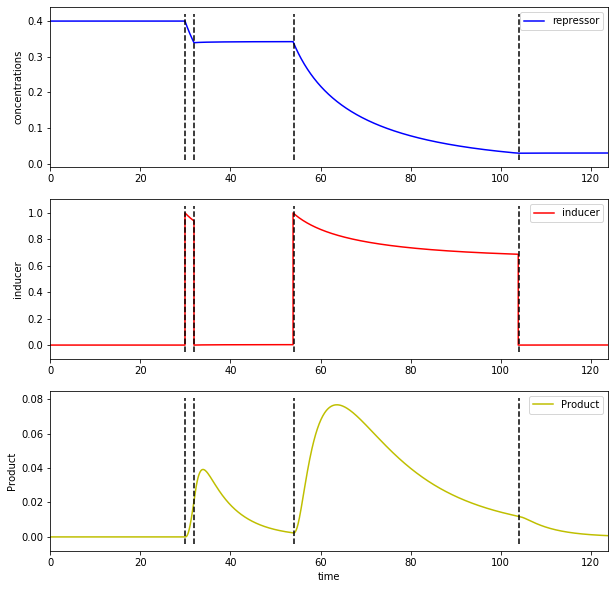

In [8]:
# the data structure below specifies a series of intervals where the first number represents the level of the inducer,
# the second represents the end of the time window for this value. 
# E.g., below the inducer is absent until time 30, present until time 32, absent again until 54, ect.

inducer_signal = [(0,30),(1,32),(0,54),(1,104),(0,124)]

# this sets the initial state; we use these to add each interval's results to it
state = [[A0,x,0,P_i0,0,0]] 
# I start the system with no enzyme and S0 amount of free substrate

process = state
# process will accumulate the results from chunks of run

time = [0]

# this for loop runs each unique interval separately, and accumulates the results

for (inducer,time_int) in inducer_signal:
    t = np.arange(0, time_int-time[-1], 0.1) 
    # this sets the next time-interval from the end of the previous one to the next end-point
    init_state = state[-1]
    # this sets the initial state for this interval to the last state of the previous one
    # that said, we are changing the level of inducer for each interval, so we will override its value. 
    # since the code above works with the MM equation, here I will modulate the enzyme level as if it were equal to the inducer value we are changing in each steps
    init_state[1] = inducer
    state = odeint(repressor_trs, init_state, t)
    process = np.concatenate((process,state),axis=0)
    time = np.concatenate((time,time[-1]+t),axis=0)


    
fig = plt.figure(figsize = (10,10))
ax = fig.add_subplot(311)
plt.xlim(0,time[-1])
plt.plot(time,process[:, 0],'b-',label = 'repressor')
(ymin, ymax) = ax.get_ylim()

for (inducer,time_int) in inducer_signal:
    plt.plot([time_int,time_int],[ymin,ymax],'k--')

plt.ylabel('concentrations')
plt.legend()

ax = fig.add_subplot(312)
plt.xlim(0,time[-1])
plt.plot(time,process[:, 1],'r-',label = 'inducer')
(ymin, ymax) = ax.get_ylim()
for (inducer,time_int) in inducer_signal:
    plt.plot([time_int,time_int],[ymin,ymax],'k--')
#plt.plot([time[0],time[-1]],[Tr_Y,Tr_Y],'k--',label = 'threshold')
  # this can add a threshold
plt.ylabel('inducer')
plt.legend()
ax = fig.add_subplot(313)
plt.xlim(0,time[-1])
plt.plot(time,process[:, 5],'y-',label = 'Product')
(ymin, ymax) = ax.get_ylim()

for (inducer,time_int) in inducer_signal:
    plt.plot([time_int,time_int],[ymin,ymax],'k--')
plt.ylabel('Product')
plt.legend()
plt.xlabel('time')
plt.show()
